# Plant Pathology 2020 — FGVC7

**Задача:** По фотографии листа яблони определить его состояние — здоровый, ржавчина, парша или множественные заболевания.

**Метрика:** ROC-AUC (macro-averaged) — площадь под ROC-кривой, усреднённая по всем 4 классам.

**Пайплайн решения:**
1. EDA 
2. Подготовка данных — K-Fold, oversampling, аугментации
3. Обучение — EfficientNet-B3, AdamW, CosineAnnealing
4. Ансамблирование — 5-Fold + TTA (Test-Time Augmentation)
5. Формирование сабмита

In [1]:
import os                          
import random                      
import warnings                    
import numpy as np                 
import pandas as pd                
import matplotlib.pyplot as plt   
import seaborn as sns              
from PIL import Image              
import cv2                         
from collections import defaultdict  


# tqdm: обычный текстовый прогресс (работает без ipywidgets).
# Для полоски-виджета в Jupyter: pip install ipywidgets
from tqdm import tqdm


import torch                       
import torch.nn as nn              
import torch.optim as optim        
from torch.utils.data import Dataset, DataLoader  

# timm — библиотека предобученных моделей (EfficientNet, ResNet, ViT, ...)
import timm

# albumentations — быстрые аугментации изображений
import albumentations as A
from albumentations.pytorch import ToTensorV2  # конвертация numpy → torch.Tensor


from sklearn.model_selection import StratifiedKFold  
from sklearn.metrics import roc_auc_score, confusion_matrix, roc_curve, auc

# Подавляем предупреждения, чтобы вывод был чистым
warnings.filterwarnings('ignore')

print("Все библиотеки импортированы успешно!")

Все библиотеки импортированы успешно!


In [2]:
class CFG:
    """Все гиперпараметры эксперимента в одном месте"""
    
    # --- Воспроизводимость ---
    seed = 42                   # фиксируем все случайные состояния
    
    # --- Данные ---
    data_dir = 'plant-pathology-2020-fgvc7'  # путь к папке с данными
    img_size = 512              # размер изображения (ширина = высота = 512 px)
    
    # --- Обучение ---
    batch_size = 16             
    epochs = 20                 
    lr = 1e-4                  
    weight_decay = 1e-5         
    
    # --- Кросс-валидация ---
    n_folds = 5                 
    
    # --- Модель ---
    model_name = 'tf_efficientnet_b3_ns'  
    num_classes = 4             # 4 класса: healthy, multiple_diseases, rust, scab
    
    # --- Устройство ---
    # Автоопределение: CUDA (NVIDIA GPU) → MPS (Apple Silicon) → CPU
    if torch.cuda.is_available():
        device = 'cuda'
    elif hasattr(torch.backends, 'mps') and torch.backends.mps.is_available():
        device = 'mps'
    else:
        device = 'cpu'

# Имена классов в том порядке, в каком они идут в CSV
TARGET_COLS = ['healthy', 'multiple_diseases', 'rust', 'scab']

# Цвета для визуализаций (по одному на класс)
# healthy — зелёный, multiple_diseases — красный, rust — оранжевый, scab — синий
CLASS_COLORS = ['#2ecc71', '#e74c3c', '#f39c12', '#3498db']


def seed_everything(seed):
    """Фиксируем источники случайности для воспроизводимости"""
    random.seed(seed)                          # random
    os.environ['PYTHONHASHSEED'] = str(seed)   # хеширование
    np.random.seed(seed)                       # NumPy
    torch.manual_seed(seed)                    # PyTorch CPU
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)           # PyTorch GPU (текущий)
        torch.cuda.manual_seed_all(seed)       # PyTorch GPU (все)
        torch.backends.cudnn.deterministic = True   # детерминированные алгоритмы
        torch.backends.cudnn.benchmark = False      # отключаем автоподбор алгоритмов


seed_everything(CFG.seed)

# Настройка DataLoader в зависимости от устройства
# На macOS/MPS num_workers>0 может вызывать ошибки multiprocessing
NUM_WORKERS = 4 if CFG.device == 'cuda' else 0
PIN_MEMORY = (CFG.device == 'cuda')

print(f"Устройство: {CFG.device}")
print(f"Модель:     {CFG.model_name}")
print(f"Размер:     {CFG.img_size}x{CFG.img_size}")
print(f"Батч:       {CFG.batch_size}")
print(f"Эпох:       {CFG.epochs}")
print(f"Фолдов:     {CFG.n_folds}")
print(f"Workers:    {NUM_WORKERS}")

Устройство: mps
Модель:     tf_efficientnet_b3_ns
Размер:     512x512
Батч:       16
Эпох:       20
Фолдов:     5
Workers:    0


## Загрузка данных

Загружаем три CSV-файла:
- **train.csv** — обучающие данные с метками (one-hot encoded)
- **test.csv** — тестовые данные (только image_id, без меток)
- **sample_submission.csv** — формат для отправки на Kaggle

In [3]:
# Читаем CSV-файлы в pandas DataFrame
train_df = pd.read_csv(os.path.join(CFG.data_dir, 'train.csv'))
test_df= pd.read_csv(os.path.join(CFG.data_dir, 'test.csv'))
sample_sub = pd.read_csv(os.path.join(CFG.data_dir, 'sample_submission.csv'))

# Выводим размеры
print(f"Обучающая выборка:  {train_df.shape[0]} изображений, {train_df.shape[1]} столбцов")
print(f"Тестовая выборка:   {test_df.shape[0]} изображений")
print(f"Формат сабмита:     {sample_sub.shape}")
print(f"\nСтолбцы train.csv: {train_df.columns.tolist()}")
print(f"\nПервые 5 строк:")
train_df.head()

Обучающая выборка:  1821 изображений, 5 столбцов
Тестовая выборка:   1821 изображений
Формат сабмита:     (1821, 5)

Столбцы train.csv: ['image_id', 'healthy', 'multiple_diseases', 'rust', 'scab']

Первые 5 строк:


,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


---
##  Разведочный анализ данных (EDA)


Исследуем:
1. Распределение классов 
2. Примеры изображений каждого класса
3. Размеры изображений
4. Дубликаты 
5. Цветовые характеристики по классам

###  Распределение классов



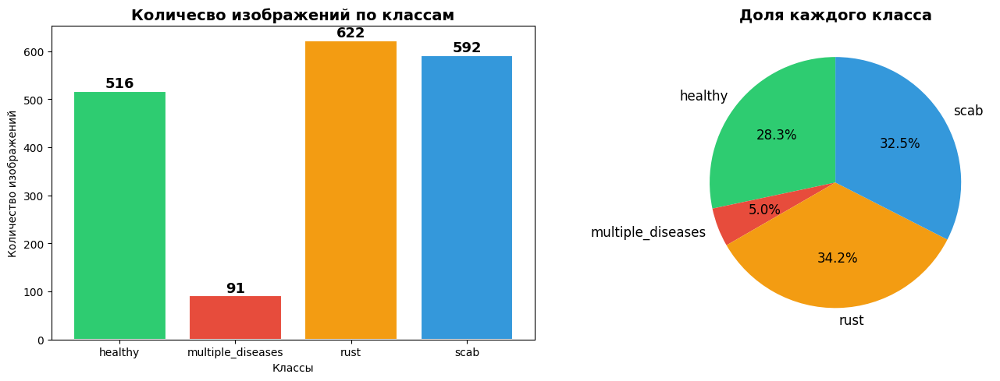


--- Статистика классов ---
  healthy             :   516 изображений ( 28.3%)
  multiple_diseases   :    91 изображений (  5.0%)
  rust                :   622 изображений ( 34.2%)
  scab                :   592 изображений ( 32.5%)

  ВСЕГО               :  1821 изображений


In [ ]:
# Считаем количество примеров каждого класса
# train_df[TARGET_COLS].sum() — суммирует единицы в one-hot столбцах
class_counts = train_df[TARGET_COLS].sum().astype(int)

# Создаём два графика рядом: столбчатый и круговой
fig,axes = plt.subplots(1, 2, figsize =(14,5))
# --- Левый график: столбчатая диаграмма ---
bars = axes[0].bar(class_counts.index, class_counts.values, color=CLASS_COLORS, edgecolor = 'white',linewidth=1.5)
axes[0].set_title('Количесво изображений по классам', fontsize = 14, fontweight = 'bold')
axes[0].set_xlabel('Классы')
axes[0].set_ylabel('Количество изображений')

# Подписываем точные значения над каждым столбцом
for bar, val in zip(bars, class_counts.values):
    axes[0].text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 8, str(val), ha = 'center', fontsize =13, fontweight= 'bold')

# --- Правый график: круговая диаграмма ---
axes[1].pie(class_counts.values, labels=class_counts.index, colors=CLASS_COLORS,
            autopct='%1.1f%%', startangle=90, textprops={'fontsize': 12})
axes[1].set_title('Доля каждого класса', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

# Выводим текстовую статистику
print("\n--- Статистика классов ---")
for col in TARGET_COLS:
    count = int(train_df[col].sum())
    pct = count / len(train_df) * 100
    print(f"  {col:20s}: {count:5d} изображений ({pct:5.1f}%)")

print(f"\n  {'ВСЕГО':20s}: {len(train_df):5d} изображений")


Класс множественных заболеваний редкий (~5%), поэтому для  macro ROC-AUC и устойчивого обучения нужны меры по балансировке и регуляризации (oversampling, аугментации, стратифицированные фолды)

### Примеры изображений каждого класса

Визуально понять, как выглядит каждая болезнь и можно ли их различить человеческим глазом.

- **healthy** — равномерный зелёный лист без повреждений
- **rust** (ржавчина) — характерные оранжево-жёлтые пятна
- **scab** (парша) — тёмные/коричневые неровные пятна
- **multiple_diseases** — сочетание признаков нескольких болезней

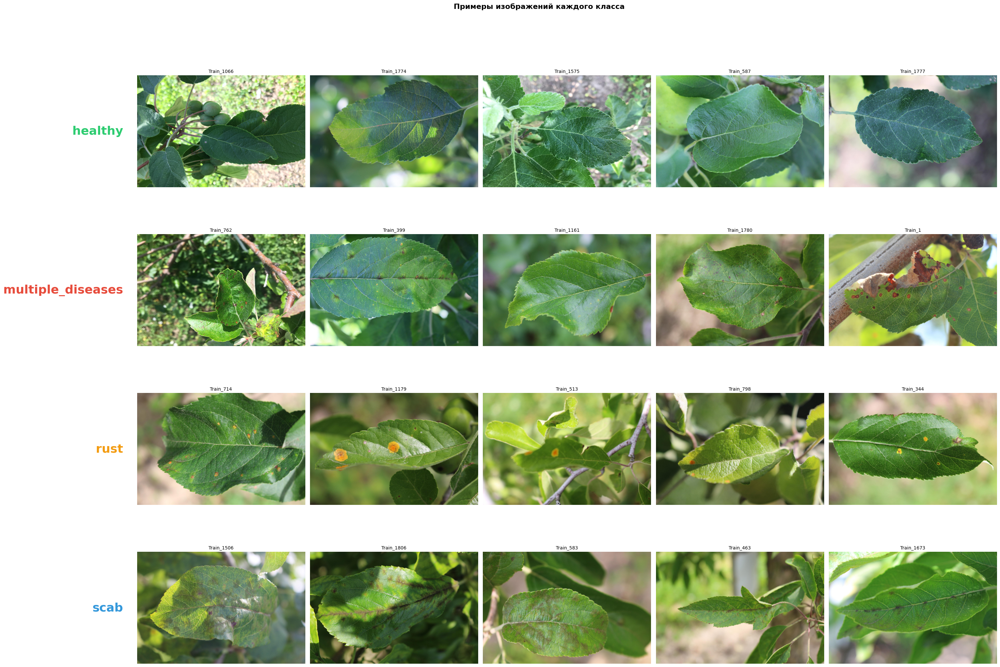

In [5]:
# Показываем по 5 случайных примеров каждого класса (4 строки x 5 столбцов)
fig, axes = plt.subplots(4, 5, figsize=(28, 21))

for row, (cls, color) in enumerate(zip(TARGET_COLS, CLASS_COLORS)):
    # Берём 5 случайных изображений данного класса
    samples = train_df[train_df[cls] == 1].sample(5, random_state=CFG.seed)
    
    for col_idx, (_, sample) in enumerate(samples.iterrows()):
        # Формируем путь к изображению
        img_path = os.path.join(CFG.data_dir, 'images', f"{sample['image_id']}.jpg")
        img = Image.open(img_path)
        
        # Отображаем
        axes[row][col_idx].imshow(img)
        axes[row][col_idx].set_title(f"{sample['image_id']}", fontsize=10)
        axes[row][col_idx].axis('off')  # убираем оси
    
plt.suptitle('Примеры изображений каждого класса', fontsize=16, fontweight='bold', y=1.01)

plt.tight_layout(rect=[0.06, 0, 1, 0.98])

for row, (cls, color) in enumerate(zip(TARGET_COLS, CLASS_COLORS)):
    pos = axes[row][0].get_position()
    fig.text(
        pos.x0 - 0.015,
        (pos.y0 + pos.y1) / 2,
        cls,
        ha='right',
        va='center',
        rotation=0,
        fontsize=26,
        fontweight='bold',
        color=color,
        transform=fig.transFigure,
    )
plt.show()

### Анализ размеров изображений

Определить оптимальный `img_size` для модели.


Считываем размеры:   0%|          | 0/1821 [00:00<?, ?it/s]

Считываем размеры: 100%|██████████| 1821/1821 [00:00<00:00, 4050.58it/s]


Ширина  — min: 1365, max: 2048, mean: 2047
Высота  — min: 1365, max: 2048, mean: 1366
Уникальных размеров: 2


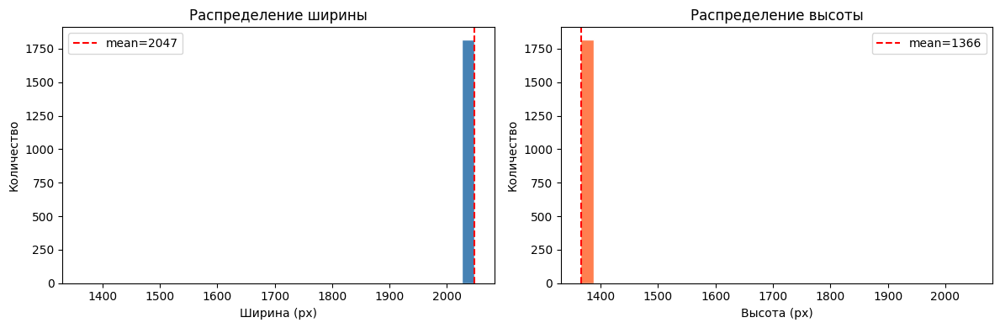


Вывод: Resize до 512x512 — разумный компромисс.


In [ ]:
# Собираем размеры всех обучающих изображений
widths, heights = [], []
for img_id in tqdm(train_df['image_id'], desc='Считываем размеры'):
    img_path = os.path.join(CFG.data_dir, 'images', f'{img_id}.jpg')
    with Image.open(img_path) as img:  # with — автоматически закрывает файл
        w, h = img.size
        widths.append(w)
        heights.append(h)

# Выводим статистику
print(f"Ширина  — min: {min(widths)}, max: {max(widths)}, mean: {np.mean(widths):.0f}")
print(f"Высота  — min: {min(heights)}, max: {max(heights)}, mean: {np.mean(heights):.0f}")
print(f"Уникальных размеров: {len(set(zip(widths, heights)))}")

# Визуализация
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].hist(widths, bins=30, color='steelblue', edgecolor='white')
axes[0].set_title('Распределение ширины', fontsize=12)
axes[0].set_xlabel('Ширина (px)')
axes[0].set_ylabel('Количество')
axes[0].axvline(x=np.mean(widths), color='red', linestyle='--', label=f'mean={np.mean(widths):.0f}')
axes[0].legend()

axes[1].hist(heights, bins=30, color='coral', edgecolor='white')
axes[1].set_title('Распределение высоты', fontsize=12)
axes[1].set_xlabel('Высота (px)')
axes[1].set_ylabel('Количество')
axes[1].axvline(x=np.mean(heights), color='red', linestyle='--', label=f'mean={np.mean(heights):.0f}')
axes[1].legend()

plt.tight_layout()
plt.show()

print(f"\nВывод: Resize до {CFG.img_size}x{CFG.img_size} ")

###  Поиск дубликатов (зашумлённые метки)


Используем **difference hash (dHash)** — быстрый алгоритм, который:
1. Уменьшает изображение до маленького размера (9x8)
2. Сравнивает соседние пиксели (левый > правый?)
3. Получает 64-битный «отпечаток» изображения

Одинаковые отпечатки = одинаковые (или почти одинаковые) изображения.

In [7]:
def compute_dhash(img_path, hash_size=8):
    
    """
    Difference Hash — быстрый перцептивный хеш изображения.
    Два визуально одинаковых изображения дадут одинаковый хеш,
    даже если они немного отличаются яркостью/контрастом.
    """
    # Читаем как grayscale (чёрно-белое) — цвет не нужен для сравнения структуры
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    # Уменьшаем до (hash_size+1) x hash_size — получаем «отпечаток»
    img = cv2.resize(img, (hash_size + 1, hash_size))
    # Сравниваем каждый пиксель с соседним справа: True если левый > правого
    diff = img[:, 1:] > img[:, :-1]
    # Конвертируем в байтовую строку — это и есть хеш
    return diff.tobytes()


# Хешируем все обучающие изображения
hash_dict = defaultdict(list)  # словарь: хеш → список image_id

for _, row in tqdm(train_df.iterrows(), total=len(train_df), desc='Хеширование изображений'):
    img_path = os.path.join(CFG.data_dir, 'images', f"{row['image_id']}.jpg")
    h = compute_dhash(img_path)
    hash_dict[h].append(row['image_id'])

# Находим группы дубликатов (хеш встречается более 1 раза)
duplicates = {h: ids for h, ids in hash_dict.items() if len(ids) > 1}

print(f"Найдено групп дубликатов: {len(duplicates)}")
print()

# Показываем каждую группу с метками
for group_idx, (h, ids) in enumerate(duplicates.items()):
    print(f"--- Группа {group_idx + 1} ---")
    for img_id in ids:
        row = train_df[train_df['image_id'] == img_id].iloc[0]
        label = TARGET_COLS[row[TARGET_COLS].values.argmax()]
        print(f"  {img_id} -> метка: {label}")
    print()

Хеширование изображений: 100%|██████████| 1821/1821 [00:05<00:00, 316.45it/s]

Найдено групп дубликатов: 1

--- Группа 1 ---
  Train_379 -> метка: scab
  Train_1173 -> метка: multiple_diseases



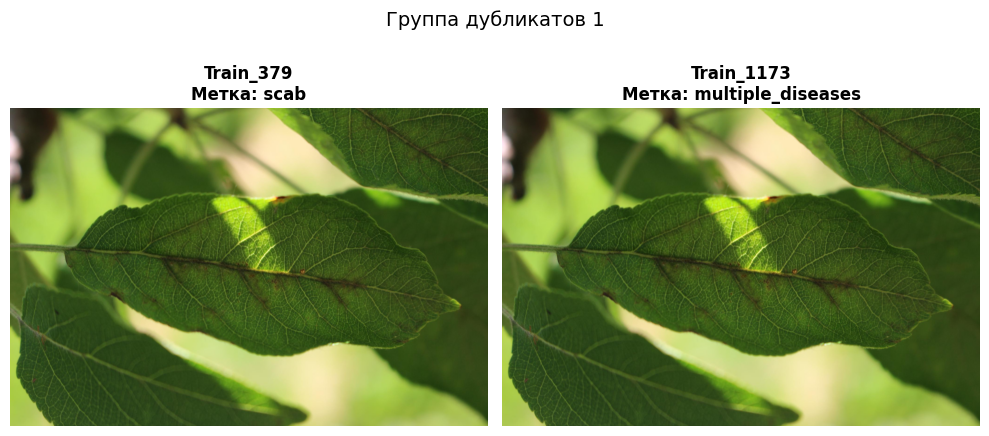

шумные данные


In [12]:
# Визуализируем найденные дубликаты (первые 3 группы)
groups_to_show = list(duplicates.values())[:3]

if groups_to_show:
    for group_idx, ids in enumerate(groups_to_show):
        fig, axes = plt.subplots(1, len(ids), figsize=(5 * len(ids), 5))
        if len(ids) == 1:
            axes = [axes]
        if not isinstance(axes, np.ndarray):
            axes = [axes]
        
        for ax, img_id in zip(axes, ids):
            img_path = os.path.join(CFG.data_dir, 'images', f"{img_id}.jpg")
            img = Image.open(img_path)
            ax.imshow(img)
            row = train_df[train_df['image_id'] == img_id].iloc[0]
            label = TARGET_COLS[row[TARGET_COLS].values.argmax()]
            ax.set_title(f"{img_id}\nМетка: {label}", fontsize=12, fontweight='bold')
            ax.axis('off')
        
        plt.suptitle(f'Группа дубликатов {group_idx + 1}', fontsize=14)
        plt.tight_layout()
        plt.show()

    
    print("шумные данные")
else:
    print("Дубликатов не найдено (возможно, различия слишком тонкие для dHash).")

### Цветовой анализ по классам

**Цель:** Понять, различаются ли классы по среднему цвету.
- **Ржавчина** — ожидаем повышенные значения в красном/жёлтом каналах
- **Парша** — ожидаем более тёмные оттенки
- **Healthy** — чистый зелёный

Цветовой анализ: 100%|██████████| 1821/1821 [00:46<00:00, 38.95it/s]


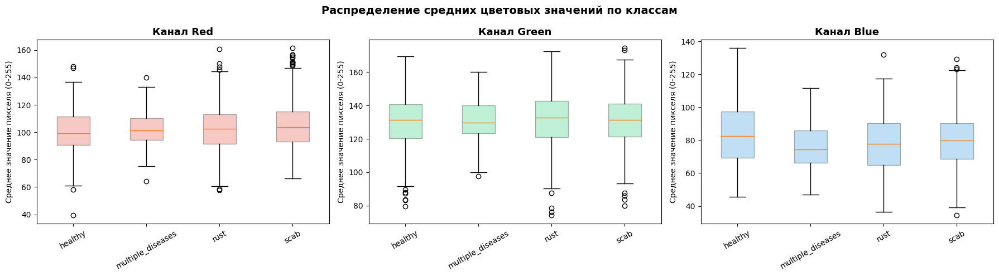

In [13]:
# Собираем средние значения RGB для каждого изображения, группируя по классам
mean_colors = {cls: [] for cls in TARGET_COLS}

for _, row in tqdm(train_df.iterrows(), total=len(train_df), desc='Цветовой анализ'):
    cls = TARGET_COLS[row[TARGET_COLS].values.argmax()]
    img_path = os.path.join(CFG.data_dir, 'images', f"{row['image_id']}.jpg")
    img = cv2.imread(img_path)                      # читаем в BGR формате
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)      # конвертируем в RGB
    mean_rgb = img.mean(axis=(0, 1))                # среднее по всем пикселям: [R, G, B]
    mean_colors[cls].append(mean_rgb)

# Визуализация: boxplot для каждого цветового канала
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
channels = ['Red', 'Green', 'Blue']
channel_plot_colors = ['#e74c3c', '#2ecc71', '#3498db']

for ch_idx, (ch_name, ch_color) in enumerate(zip(channels, channel_plot_colors)):
    # Собираем данные для boxplot
    data = []
    for cls in TARGET_COLS:
        values = [c[ch_idx] for c in mean_colors[cls]]
        data.append(values)
    
    bp = axes[ch_idx].boxplot(data, labels=TARGET_COLS, patch_artist=True)
    for patch in bp['boxes']:
        patch.set_facecolor(ch_color)
        patch.set_alpha(0.3)
    
    axes[ch_idx].set_title(f'Канал {ch_name}', fontsize=13, fontweight='bold')
    axes[ch_idx].set_ylabel('Среднее значение пикселя (0-255)')
    axes[ch_idx].tick_params(axis='x', rotation=30)

plt.suptitle('Распределение средних цветовых значений по классам', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### Выводы EDA

| Наблюдение | Влияние на стратегию |
|---|---|
| Класс `multiple_diseases` сильно недопредставлен | **Oversampling** этого класса в 5 раз |
| Есть дубликаты с разными метками | Данные **зашумлены** — используем аугментации и label smoothing |
| Все изображения примерно одного размера | Resize до 512x512 — безопасный выбор |
| Классы визуально различимы | Предобученная модель должна справиться хорошо |

---

## Подготовка данных — K-Fold и Oversampling

**CV-стратегия:**
- `StratifiedKFold(5)` — делим данные на 5 фолдов с сохранением пропорций классов
- Каждое изображение ровно 1 раз попадает в валидацию
- Oversampling `multiple_diseases` x5 **только в train-части** каждого фолда

Распределение классов по фолдам:
  Fold 0:  365 изображений | healthy=103 | multiple_diseases=18 | rust=125 | scab=119
  Fold 1:  364 изображений | healthy=103 | multiple_diseases=18 | rust=124 | scab=119
  Fold 2:  364 изображений | healthy=103 | multiple_diseases=19 | rust=124 | scab=118
  Fold 3:  364 изображений | healthy=104 | multiple_diseases=18 | rust=124 | scab=118
  Fold 4:  364 изображений | healthy=103 | multiple_diseases=18 | rust=125 | scab=118
  Всего: 1821 изображений


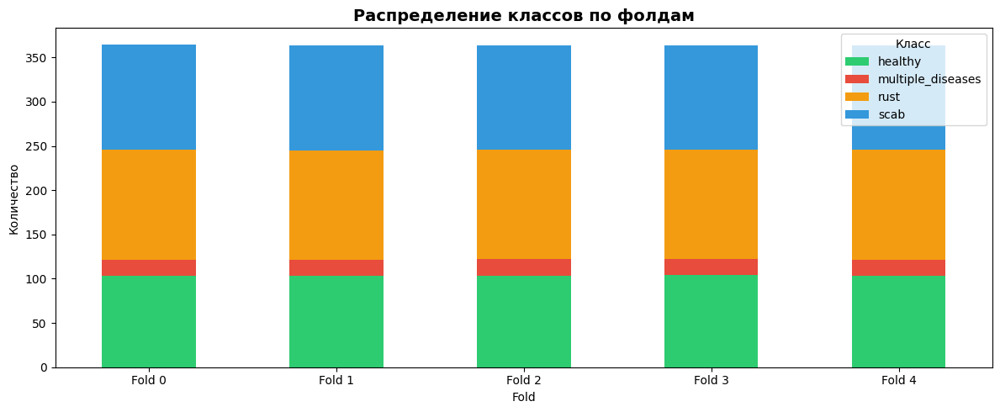

In [14]:
# Создаём столбец label — индекс класса (0=healthy, 1=multiple_diseases, 2=rust, 3=scab)
# argmax по one-hot столбцам даёт индекс единицы
train_df['label'] = train_df[TARGET_COLS].values.argmax(axis=1)

# Стратифицированное разбиение на 5 фолдов
# StratifiedKFold гарантирует одинаковые пропорции классов в каждом фолде
skf = StratifiedKFold(n_splits=CFG.n_folds, shuffle=True, random_state=CFG.seed)

train_df['fold'] = -1  # инициализируем столбец фолда
for fold_idx, (train_indices, val_indices) in enumerate(skf.split(train_df, train_df['label'])):
    train_df.loc[val_indices, 'fold'] = fold_idx

# Проверяем распределение
print("Распределение классов по фолдам:")
print("=" * 70)
for fold in range(CFG.n_folds):
    fold_df = train_df[train_df['fold'] == fold]
    counts = fold_df['label'].value_counts().sort_index()
    parts = [f"{TARGET_COLS[i]}={counts.get(i, 0)}" for i in range(4)]
    print(f"  Fold {fold}: {len(fold_df):4d} изображений | {' | '.join(parts)}")
print("=" * 70)
print(f"  Всего: {len(train_df)} изображений")

# Визуализируем разбиение
fig, ax = plt.subplots(figsize=(12, 5))
fold_data = []
for fold in range(CFG.n_folds):
    for cls_idx, cls in enumerate(TARGET_COLS):
        count = len(train_df[(train_df['fold'] == fold) & (train_df['label'] == cls_idx)])
        fold_data.append({'Fold': f'Fold {fold}', 'Class': cls, 'Count': count})

fold_vis = pd.DataFrame(fold_data)
fold_vis_pivot = fold_vis.pivot(index='Fold', columns='Class', values='Count')
fold_vis_pivot[TARGET_COLS].plot(kind='bar', stacked=True, ax=ax, color=CLASS_COLORS)
ax.set_title('Распределение классов по фолдам', fontsize=14, fontweight='bold')
ax.set_ylabel('Количество')
ax.legend(title='Класс')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
plt.tight_layout()
plt.show()

## Аугментации и Dataset


Датасет маленький (~1821 изображений).

### Используемые аугментации:
| Аугментация | Что делает | Зачем |
|---|---|---|
| `HorizontalFlip` | Отражение по горизонтали | Лист может быть повёрнут |
| `VerticalFlip` | Отражение по вертикали | Дополнительное разнообразие |
| `ShiftScaleRotate` | Сдвиг + масштаб + поворот | Устойчивость к положению листа |
| `RandomBrightnessContrast` | Случайная яркость/контраст | Разные условия освещения |
| `GaussianBlur` | Гауссово размытие | Устойчивость к расфокусировке |
| `CoarseDropout` | Вырезает прямоугольники (CutOut) | Модель учится по частичной информации |
| `Normalize` | Нормализация по ImageNet mean/std | Необходима для предобученных моделей |

In [15]:
def get_train_transforms(img_size):
    """
    Аугментации для обучения — максимально разнообразные.
    Каждая аугментация применяется с вероятностью p.
    """
    return A.Compose([
        # 1. Resize — приводим все изображения к единому размеру
        A.Resize(img_size, img_size),
        
        # 2. Геометрические аугментации — меняем положение/ориентацию
        A.HorizontalFlip(p=0.5),            # зеркальное отражение по горизонтали
        A.VerticalFlip(p=0.5),              # зеркальное отражение по вертикали
        A.ShiftScaleRotate(                 # комбинация сдвига, масштаба и поворота
            shift_limit=0.1,                # сдвиг до 10% от размера
            scale_limit=0.15,               # масштаб ±15%
            rotate_limit=35,                # поворот до ±35 градусов
            border_mode=cv2.BORDER_CONSTANT,
            p=0.5
        ),
        
        # 3. Цветовые аугментации — меняем освещение
        A.RandomBrightnessContrast(
            brightness_limit=0.2,           # яркость ±20%
            contrast_limit=0.2,             # контраст ±20%
            p=0.5
        ),
        
        # 4. Размытие — имитация расфокусировки камеры
        A.GaussianBlur(blur_limit=(3, 7), p=0.2),
        
        # 5. CoarseDropout (CutOut) — вырезаем случайные прямоугольники
        # Заставляет модель не полагаться на одну область изображения
        A.CoarseDropout(
            max_holes=8,                    # до 8 вырезанных областей
            max_height=img_size // 8,       # высота каждой области
            max_width=img_size // 8,        # ширина каждой области
            fill_value=0,                   # заполняем чёрным
            p=0.3
        ),
        
        # 6. Нормализация по ImageNet — ОБЯЗАТЕЛЬНА для предобученных моделей
        # mean и std — статистики ImageNet, на которых модель обучалась
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        
        # 7. Конвертация numpy array → PyTorch tensor
        ToTensorV2(),
    ])


def get_valid_transforms(img_size):
    """
    Аугментации для валидации/теста — ТОЛЬКО resize и нормализация.
    Никаких случайных преобразований — нужна стабильная оценка.
    """
    return A.Compose([
        A.Resize(img_size, img_size),
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2(),
    ])

print("Аугментации определены.")
print(f"Train: {len(get_train_transforms(CFG.img_size))} преобразований")
print(f"Valid: {len(get_valid_transforms(CFG.img_size))} преобразования")

Аугментации определены.
Train: 9 преобразований
Valid: 3 преобразования


In [16]:
class PlantDataset(Dataset):
    """
    PyTorch Dataset для загрузки изображений листьев.
    
    Для каждого индекса:
    1. Загружает изображение по пути image_id + .jpg
    2. Применяет аугментации (albumentations)
    3. Возвращает тензор изображения + метку класса
    """
    
    def __init__(self, df, img_dir, transforms=None, is_test=False):
        """
        df       — DataFrame с колонкой image_id (и label для train)
        img_dir  — путь к папке с изображениями
        transforms — аугментации albumentations
        is_test  — True для тестовых данных (нет меток)
        """
        self.df = df.reset_index(drop=True)  # сбрасываем индекс для корректной индексации
        self.img_dir = img_dir
        self.transforms = transforms
        self.is_test = is_test
    
    def __len__(self):
        """Количество изображений в датасете"""
        return len(self.df)
    
    def __getitem__(self, idx):
        """Загрузка одного изображения по индексу"""
        row = self.df.iloc[idx]
        
        # Формируем путь и читаем изображение через OpenCV (формат BGR)
        img_path = os.path.join(self.img_dir, f"{row['image_id']}.jpg")
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # BGR → RGB (стандарт для нейросетей)
        
        # Применяем аугментации
        if self.transforms:
            img = self.transforms(image=img)['image']  # albumentations API
        
        # Для тестовых данных возвращаем только изображение
        if self.is_test:
            return img
        
        # Для обучающих данных возвращаем изображение + метку
        label = int(row['label'])
        return img, torch.tensor(label, dtype=torch.long)


print("PlantDataset определён.")
print(f"Пример: train dataset = {len(train_df)} изображений")

PlantDataset определён.
Пример: train dataset = 1821 изображений


### Визуализация аугментаций

Посмотрим, как одно изображение выглядит после разных случайных аугментаций.
Каждый раз модель видит слегка другую версию — это и есть регуляризация.

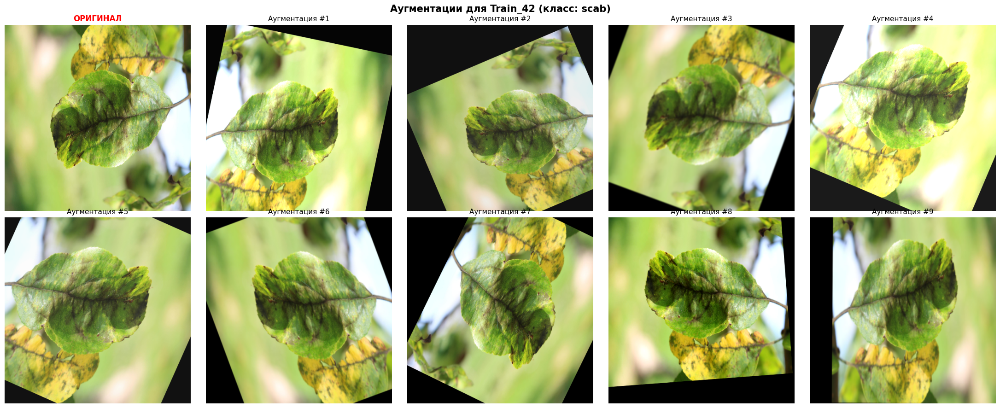

In [ ]:
# Берём одно случайное изображение для демонстрации
sample_row = train_df.iloc[42]
img_path = os.path.join(CFG.data_dir, 'images', f"{sample_row['image_id']}.jpg")
original_img = cv2.imread(img_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

# Аугментации БЕЗ нормализации (для визуализации — нужны значения 0-255)
vis_transform = A.Compose([
    A.Resize(CFG.img_size, CFG.img_size),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.15, rotate_limit=35, p=0.7),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.7),
    A.GaussianBlur(blur_limit=(3, 7), p=0.3),
])

# Создаём сетку: оригинал + 9 аугментированных версий
fig, axes = plt.subplots(2, 5, figsize=(22, 9))

# Первый — оригинал
resized = cv2.resize(original_img, (CFG.img_size, CFG.img_size))
axes[0][0].imshow(resized)
axes[0][0].set_title('ОРИГИНАЛ', fontsize=12, fontweight='bold', color='red')
axes[0][0].axis('off')

# Остальные 9 — случайные аугментации
for i in range(1, 10):
    row_idx = i // 5
    col_idx = i % 5
    augmented = vis_transform(image=original_img)['image']
    axes[row_idx][col_idx].imshow(augmented)
    axes[row_idx][col_idx].set_title(f'Аугментация #{i}', fontsize=11)
    axes[row_idx][col_idx].axis('off')

cls_name = TARGET_COLS[sample_row['label']]
plt.suptitle(f"Аугментации для {sample_row['image_id']} (класс: {cls_name})", 
             fontsize=15, fontweight='bold')
             
plt.tight_layout(rect=[0.06, 0, 1, 0.98])
plt.show()

##  Модель

Используем **EfficientNet-B3** с предобученными весами **noisy-student**:

- **EfficientNet** — семейство моделей, которые эффективно масштабируют ширину, глубину и разрешение сети
- **B3** — оптимальный размер для маленького датасета 
- **noisy-student** (`_ns`) — веса получены обучением на ImageNet + 300M дополнительных изображений с «шумными» метками. 

**Transfer Learning (перенос знаний):**
1. Берём модель, обученную на ImageNet (14M изображений, 1000 классов)
2. Заменяем последний слой: `Linear(1000)` → `Linear(4)` (наши 4 класса)
3. Дообучаем (fine-tune) на наших данных — модель адаптирует свои знания к листьям

In [18]:
class PlantModel(nn.Module):
    """
    Обёртка над предобученной моделью из timm.
    
    timm.create_model() автоматически:
    1. Скачивает архитектуру и веса
    2. Заменяет classifier на Linear(in_features, num_classes)
    """
    
    def __init__(self, model_name, num_classes, pretrained=True):
        super().__init__()
        # create_model — создаёт модель из библиотеки timm
        # pretrained=True — загружает веса, обученные на ImageNet
        # num_classes — автоматически заменяет последний слой
        self.model = timm.create_model(
            model_name, 
            pretrained=pretrained, 
            num_classes=num_classes
        )
    
    def forward(self, x):
        """Прямой проход: изображение → вероятности 4 классов"""
        return self.model(x)


# Тестируем: создаём модель и прогоняем случайный тензор
model_test = PlantModel(CFG.model_name, CFG.num_classes, pretrained=False)
dummy_input = torch.randn(1, 3, CFG.img_size, CFG.img_size)  # 1 изображение, 3 канала, 512x512
dummy_output = model_test(dummy_input)

print(f"Модель:        {CFG.model_name}")
print(f"Вход:          {dummy_input.shape}  →  [batch, channels, height, width]")
print(f"Выход:         {dummy_output.shape}  →  [batch, num_classes]")
print(f"Параметров:    {sum(p.numel() for p in model_test.parameters()):,}")

del model_test, dummy_input, dummy_output  # освобождаем память

Модель:        tf_efficientnet_b3_ns
Вход:          torch.Size([1, 3, 512, 512])  →  [batch, channels, height, width]
Выход:         torch.Size([1, 4])  →  [batch, num_classes]
Параметров:    10,702,380


## Функции обучения и валидации

### Цикл обучения одной эпохи:
1. Для каждого батча изображений:
   - **Forward pass** — прогоняем через модель, получаем предсказания
   - **Loss** — считаем ошибку (CrossEntropyLoss)
   - **Backward pass** — считаем градиенты (как менять веса)
   - **Optimizer step** — обновляем веса модели
2. Gradient clipping — ограничиваем величину градиентов (стабильность обучения)

### Валидация:
1. Модель в режиме `eval` — BatchNorm и Dropout работают детерминированно
2. `torch.no_grad()` — не считаем градиенты (экономим память и время)
3. Считаем ROC-AUC — основную метрику соревнования

In [19]:
def train_one_epoch(model, loader, optimizer, criterion, device):
    """
    Обучение модели на одной эпохе.
    
    Возвращает: средний loss за эпоху
    """
    model.train()  # включаем режим обучения (BatchNorm, Dropout активны)
    running_loss = 0.0
    
    pbar = tqdm(loader, desc='  Train', leave=False)
    for batch_idx, (images, labels) in enumerate(pbar):
        # Перемещаем данные на GPU/MPS/CPU
        images = images.to(device)
        labels = labels.to(device)
        
        # 1. Обнуляем градиенты от предыдущего шага
        optimizer.zero_grad()
        
        # 2. Forward pass — получаем «сырые» предсказания (logits)
        outputs = model(images)
        
        # 3. Считаем loss — насколько предсказания отличаются от истины
        loss = criterion(outputs, labels)
        
        # 4. Backward pass — вычисляем градиенты
        loss.backward()
        
        # 5. Gradient clipping — ограничиваем норму градиентов
        # Предотвращает «взрыв» градиентов при нестабильном обучении
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        
        # 6. Optimizer step — обновляем веса на основе градиентов
        optimizer.step()
        
        # Логируем loss
        running_loss += loss.item()
        pbar.set_postfix({'loss': f'{running_loss / (batch_idx + 1):.4f}'})
    
    return running_loss / len(loader)


@torch.no_grad()  # отключаем вычисление градиентов — экономим память
def validate(model, loader, criterion, device):
    """
    Оценка модели на валидационной выборке.
    
    Возвращает: средний loss, ROC-AUC, массив предсказаний (вероятности)
    """
    model.eval()  # режим оценки: BatchNorm использует накопленную статистику
    running_loss = 0.0
    all_preds = []   # собираем все предсказания
    all_labels = []  # собираем все метки
    
    for images, labels in tqdm(loader, desc='  Valid', leave=False):
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)
        
        running_loss += loss.item()
        
        # softmax превращает logits в вероятности (сумма = 1)
        probs = torch.softmax(outputs, dim=1)
        all_preds.append(probs.cpu().numpy())
        all_labels.append(labels.cpu().numpy())
    
    # Объединяем батчи в единые массивы
    all_preds = np.concatenate(all_preds)    # shape: [N, 4]
    all_labels = np.concatenate(all_labels)  # shape: [N]
    
    # Конвертируем метки в one-hot для ROC-AUC
    # [1, 0, 3, 2] → [[0,1,0,0], [1,0,0,0], [0,0,0,1], [0,0,1,0]]
    labels_onehot = np.eye(CFG.num_classes)[all_labels]
    
    # ROC-AUC macro — метрика соревнования
    auc_score = roc_auc_score(labels_onehot, all_preds, multi_class='ovr', average='macro')
    
    return running_loss / len(loader), auc_score, all_preds


print("Функции обучения и валидации определены.")

Функции обучения и валидации определены.


## Обучение — 5-Fold Cross-Validation

**Алгоритм:**

Для каждого из 5 фолдов:
1. Разделяем данные: 80% train, 20% validation
2. Oversampling `multiple_diseases` x5 в train-части
3. Создаём модель с предобученными весами
4. Обучаем 20 эпох с CosineAnnealing scheduler
5. Сохраняем лучшую модель (по ROC-AUC на валидации)
6. Собираем OOF (Out-of-Fold) предсказания

**OOF-предсказания** — это предсказания модели на тех данных, которые она НЕ видела при обучении. Собрав OOF для всех фолдов, мы получаем честную оценку на всех обучающих данных.

**Логи обучения:** после обучения создаются файлы в папке `logs/`:
- `training_log_full.csv` — все эпохи всех фолдов;
- `training_log_best_fold.txt` — **лог лучшего фолда** (максимальный ROC-AUC на валидации);
- `training_summary.txt` — сводка по fold_scores.


In [ ]:
# Массив для Out-of-Fold предсказаний: [N_train, 4 класса]
oof_preds = np.zeros((len(train_df), CFG.num_classes))

# Списки для хранения результатов
fold_scores = []   # лучший ROC-AUC каждого фолда
histories = []     # история loss/AUC по эпохам

# Подробный лог обучения — каждая строка = одна эпоха одного фолда
training_log = []

# Папка для файлов логов 
LOG_DIR = "logs"
os.makedirs(LOG_DIR, exist_ok=True)

import time
import datetime

total_start = time.time()
run_started = datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S")

for fold in range(CFG.n_folds):
    print(f"\n{'=' * 65}")
    print(f"  FOLD {fold + 1} / {CFG.n_folds}")
    print(f"{'=' * 65}")
    fold_start = time.time()

    # ---- 1. Разделяем данные ----
    train_fold = train_df[train_df['fold'] != fold].copy()
    valid_fold = train_df[train_df['fold'] == fold].copy()

    # ---- 2. Oversampling multiple_diseases (класс 1) ----
    minority = train_fold[train_fold['label'] == 1]
    train_fold = pd.concat([train_fold] + [minority] * 4, ignore_index=True)
    train_fold = train_fold.sample(frac=1, random_state=CFG.seed).reset_index(drop=True)

    print(f"  Train: {len(train_fold)} (после oversampling), Valid: {len(valid_fold)}")

    # ---- 3. Dataset и DataLoader ----
    img_dir = os.path.join(CFG.data_dir, 'images')

    train_dataset = PlantDataset(train_fold, img_dir, get_train_transforms(CFG.img_size))
    valid_dataset = PlantDataset(valid_fold, img_dir, get_valid_transforms(CFG.img_size))

    train_loader = DataLoader(
        train_dataset,
        batch_size=CFG.batch_size,
        shuffle=True,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
        drop_last=True,
    )
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=CFG.batch_size * 2,
        shuffle=False,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY,
    )

    # ---- 4. Модель, оптимизатор, scheduler, loss ----
    model = PlantModel(CFG.model_name, CFG.num_classes, pretrained=True)
    model.to(CFG.device)

    optimizer = optim.AdamW(model.parameters(), lr=CFG.lr, weight_decay=CFG.weight_decay)

    scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(
        optimizer, T_0=CFG.epochs, eta_min=1e-7
    )

    criterion = nn.CrossEntropyLoss()

    # ---- 5. Цикл обучения ----
    best_auc = 0.0
    best_epoch = 0
    best_preds = None
    history = {'train_loss': [], 'valid_loss': [], 'valid_auc': [], 'lr': []}

    for epoch in range(CFG.epochs):
        current_lr = optimizer.param_groups[0]['lr']
        print(f"\n  Epoch {epoch + 1}/{CFG.epochs}  (lr={current_lr:.2e})")
        epoch_start = time.time()

        train_loss = train_one_epoch(model, train_loader, optimizer, criterion, CFG.device)
        valid_loss, valid_auc, valid_preds = validate(model, valid_loader, criterion, CFG.device)

        scheduler.step()

        epoch_time = time.time() - epoch_start

        history['train_loss'].append(train_loss)
        history['valid_loss'].append(valid_loss)
        history['valid_auc'].append(valid_auc)
        history['lr'].append(current_lr)

        improved = valid_auc > best_auc
        marker = " <<< BEST" if improved else ""

        print(
            f"  Train Loss: {train_loss:.4f} | Valid Loss: {valid_loss:.4f} | "
            f"Valid AUC: {valid_auc:.5f} | Time: {epoch_time:.0f}s{marker}"
        )

        training_log.append({
            'fold': fold + 1,
            'epoch': epoch + 1,
            'train_loss': round(train_loss, 5),
            'valid_loss': round(valid_loss, 5),
            'valid_auc': round(valid_auc, 5),
            'lr': round(current_lr, 8),
            'epoch_time_sec': round(epoch_time, 1),
            'is_best': improved,
        })

        if improved:
            best_auc = valid_auc
            best_epoch = epoch + 1
            best_preds = valid_preds.copy()
            torch.save(model.state_dict(), f'model_fold{fold}.pth')
            print(f"  >>> Новый лучший AUC: {best_auc:.5f} — модель сохранена!")

    fold_time = time.time() - fold_start

    valid_indices = train_df[train_df['fold'] == fold].index
    oof_preds[valid_indices] = best_preds

    fold_scores.append(best_auc)
    histories.append(history)

    print(f"\n  Fold {fold + 1} лучший AUC: {best_auc:.5f} (epoch {best_epoch})")
    print(f"  Fold {fold + 1} время обучения: {fold_time / 60:.1f} мин")

    del model, optimizer, scheduler, train_loader, valid_loader
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

total_time = time.time() - total_start

# ---- Итоговые результаты ----
print(f"\n{'=' * 65}")
print(f"  ИТОГОВЫЕ РЕЗУЛЬТАТЫ КРОСС-ВАЛИДАЦИИ")
print(f"{'=' * 65}")
for i, score in enumerate(fold_scores):
    best_ep_rows = [log for log in training_log if log['fold'] == i + 1 and log['is_best']]
    best_ep_num = best_ep_rows[-1]['epoch'] if best_ep_rows else '?'
    print(f"  Fold {i + 1}: AUC = {score:.5f}  (лучшая эпоха: {best_ep_num})")
print(f"  {'─' * 40}")
print(f"  Среднее:     {np.mean(fold_scores):.5f} +/- {np.std(fold_scores):.5f}")
print(f"  Общее время: {total_time / 60:.1f} мин")




  FOLD 1 / 5
  Train: 1748 (после oversampling), Valid: 365


model.safetensors:   0%|          | 0.00/49.3M [00:00<?, ?B/s]


  Epoch 1/20  (lr=1.00e-04)


  Train:  34%|███▍      | 37/109 [1:30:16<3:16:02, 163.37s/it, loss=1.2437]

In [ ]:
# ---- Сохранение логов в файлы ----
log_df = pd.DataFrame(training_log)
full_csv = os.path.join(LOG_DIR, 'training_log_full.csv')
log_df.to_csv(full_csv, index=False)
print(f"\n  Полный лог (все фолды): {full_csv} ({len(log_df)} строк)")

# Лучший фолд по итоговому ROC-AUC на валидации
best_fold_idx = int(np.argmax(fold_scores))
best_fold_num = best_fold_idx + 1
best_fold_auc = fold_scores[best_fold_idx]

log_best = log_df[log_df['fold'] == best_fold_num].copy()

best_txt = os.path.join(LOG_DIR, 'training_log_best_fold.txt')
with open(best_txt, 'w', encoding='utf-8') as f:
    f.write('Plant Pathology 2020 — лог обучения ЛУЧШЕГО фолда (по ROC-AUC на валидации)\n')
    f.write('=' * 72 + '\n')
    f.write(f'Запуск:              {run_started}\n')
    f.write(f'Модель:              {CFG.model_name}\n')
    f.write(f'Устройство:          {CFG.device}\n')
    f.write(f'Размер изображения:  {CFG.img_size}x{CFG.img_size}\n')
    f.write(f'Батч / эпохи:        {CFG.batch_size} / {CFG.epochs}\n')
    f.write(f'Лучший фолд:         {best_fold_num} из {CFG.n_folds}\n')
    f.write(f'Лучший Valid AUC:    {best_fold_auc:.5f}\n')
    f.write(f'Средний CV AUC:      {np.mean(fold_scores):.5f} +/- {np.std(fold_scores):.5f}\n')
    f.write('=' * 72 + '\n\n')
    f.write(f"{'Epoch':>5} {'TrainLoss':>12} {'ValidLoss':>12} {'ValidAUC':>10} {'LR':>14} {'t(s)':>8}  BEST\n")
    f.write('-' * 72 + '\n')
    for _, row in log_best.iterrows():
        star = '  *' if row['is_best'] else ''
        f.write(
            f"{int(row['epoch']):5d} {row['train_loss']:12.5f} {row['valid_loss']:12.5f} "
            f"{row['valid_auc']:10.5f} {row['lr']:14.8f} {row['epoch_time_sec']:8.1f}{star}\n"
        )
    f.write('-' * 72 + '\n')
    f.write(f'* — эпоха, на которой обновлялся чекпоинт model_fold{best_fold_idx}.pth\n')

print(f"  Лог лучшего фолда:      {best_txt}")

summary_txt = os.path.join(LOG_DIR, 'training_summary.txt')
with open(summary_txt, 'w', encoding='utf-8') as f:
    f.write('Сводка кросс-валидации\n')
    f.write('=' * 40 + '\n')
    for i, s in enumerate(fold_scores):
        f.write(f'Fold {i+1}: ROC-AUC = {s:.5f}\n')
    f.write(f'Mean:     {np.mean(fold_scores):.5f}\n')
    f.write(f'Std:      {np.std(fold_scores):.5f}\n')
    f.write(f'Best fold: {best_fold_num} (AUC = {best_fold_auc:.5f})\n')
    f.write(f'Total time: {total_time/60:.1f} min\n')

print(f"  Краткая сводка:         {summary_txt}")
print("\n  Файлы из папки logs/ можно приложить к отчёту как логи обучения.")


## Анализ результатов обучения

Теперь посмотрим:
1. **Кривые обучения** — как менялся loss и AUC по эпохам 
2. **Confusion Matrix** — какие классы путаются между собой
3. **ROC-кривые** — качество для каждого класса отдельно
4. **Примеры ошибок** — на каких изображениях модель ошибается

In [ ]:
# --- Кривые обучения (Loss и AUC) для каждого фолда ---
fig, axes = plt.subplots(CFG.n_folds, 2, figsize=(15, 4 * CFG.n_folds))

for fold in range(CFG.n_folds):
    h = histories[fold]
    epochs_range = range(1, len(h['train_loss']) + 1)
    
    # Левый график: Loss
    axes[fold][0].plot(epochs_range, h['train_loss'], 'b-', linewidth=2, label='Train Loss')
    axes[fold][0].plot(epochs_range, h['valid_loss'], 'r-', linewidth=2, label='Valid Loss')
    axes[fold][0].set_title(f'Fold {fold + 1} — Loss', fontsize=12, fontweight='bold')
    axes[fold][0].set_xlabel('Epoch')
    axes[fold][0].set_ylabel('Loss')
    axes[fold][0].legend()
    axes[fold][0].grid(True, alpha=0.3)
    
    # Правый график: AUC
    axes[fold][1].plot(epochs_range, h['valid_auc'], 'g-', linewidth=2, marker='o', markersize=3)
    axes[fold][1].set_title(f'Fold {fold + 1} — ROC-AUC (best: {fold_scores[fold]:.5f})', 
                            fontsize=12, fontweight='bold')
    axes[fold][1].set_xlabel('Epoch')
    axes[fold][1].set_ylabel('ROC-AUC')
    axes[fold][1].axhline(y=fold_scores[fold], color='red', linestyle='--', alpha=0.5, 
                          label=f'Best: {fold_scores[fold]:.5f}')
    axes[fold][1].legend()
    axes[fold][1].grid(True, alpha=0.3)

plt.suptitle('Кривые обучения по фолдам', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

In [ ]:
# --- Confusion Matrix (матрица ошибок) ---
oof_labels = train_df['label'].values           # истинные метки
oof_pred_labels = oof_preds.argmax(axis=1)      # предсказанные метки (argmax вероятностей)

# Вычисляем confusion matrix
cm = confusion_matrix(oof_labels, oof_pred_labels)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Абсолютные значения
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=TARGET_COLS, yticklabels=TARGET_COLS, ax=axes[0])
axes[0].set_xlabel('Предсказано', fontsize=12)
axes[0].set_ylabel('Истинная метка', fontsize=12)
axes[0].set_title(f'Confusion Matrix (абс.)\nOOF ROC-AUC: {np.mean(fold_scores):.5f}', fontsize=13)

# Нормализованные (в процентах от истинного класса)
cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True) * 100
sns.heatmap(cm_norm, annot=True, fmt='.1f', cmap='Oranges',
            xticklabels=TARGET_COLS, yticklabels=TARGET_COLS, ax=axes[1])
axes[1].set_xlabel('Предсказано', fontsize=12)
axes[1].set_ylabel('Истинная метка', fontsize=12)
axes[1].set_title('Confusion Matrix (%, от строки)', fontsize=13)

plt.tight_layout()
plt.show()

# Точность по классам
print("Точность (accuracy) по классам:")
for i, cls in enumerate(TARGET_COLS):
    correct = cm[i, i]
    total = cm[i].sum()
    print(f"  {cls:20s}: {correct}/{total} = {correct/total*100:.1f}%")
print(f"  {'Общая':20s}: {cm.trace()}/{cm.sum()} = {cm.trace()/cm.sum()*100:.1f}%")

In [ ]:
# --- ROC-кривые для каждого класса (OOF) ---
labels_onehot = np.eye(CFG.num_classes)[oof_labels]

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, (cls, color) in enumerate(zip(TARGET_COLS, CLASS_COLORS)):
    fpr, tpr, _ = roc_curve(labels_onehot[:, i], oof_preds[:, i])
    roc_auc_val = auc(fpr, tpr)
    axes[i].plot(fpr, tpr, color=color, linewidth=2.5, label=f'AUC = {roc_auc_val:.4f}')
    axes[i].plot([0, 1], [0, 1], 'k--', linewidth=1, alpha=0.5)
    axes[i].fill_between(fpr, tpr, alpha=0.1, color=color)
    axes[i].set_title(f'{cls}', fontsize=13, fontweight='bold')
    axes[i].set_xlabel('False Positive Rate')
    axes[i].set_ylabel('True Positive Rate')
    axes[i].legend(loc='lower right', fontsize=12)
    axes[i].grid(True, alpha=0.3)

plt.suptitle('ROC-кривые по классам (OOF)', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

In [ ]:
# --- Анализ ошибок: на каких изображениях модель ошибается ---
# Находим все неправильно классифицированные примеры
errors_mask = oof_labels != oof_pred_labels
errors = train_df[errors_mask].copy()
errors['predicted'] = oof_pred_labels[errors_mask]
errors['true_class'] = errors['label'].map(lambda x: TARGET_COLS[x])
errors['pred_class'] = errors['predicted'].map(lambda x: TARGET_COLS[x])
errors['confidence'] = oof_preds[errors_mask].max(axis=1)

print(f"Всего ошибок: {len(errors)} из {len(train_df)} ({len(errors)/len(train_df)*100:.1f}%)")
print(f"\nОшибки по типам:")
error_types = errors.groupby(['true_class', 'pred_class']).size().reset_index(name='count')
error_types = error_types.sort_values('count', ascending=False)
print(error_types.to_string(index=False))

# Показываем примеры ошибок
n_show = min(len(errors), 10)
if n_show > 0:
    n_cols = 5
    n_rows = (n_show + n_cols - 1) // n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))
    axes_flat = axes.flatten() if n_rows > 1 else (axes if isinstance(axes, np.ndarray) else [axes])
    
    for i, (_, row) in enumerate(errors.head(n_show).iterrows()):
        img_path = os.path.join(CFG.data_dir, 'images', f"{row['image_id']}.jpg")
        img = Image.open(img_path)
        axes_flat[i].imshow(img)
        axes_flat[i].set_title(
            f"True: {row['true_class']}\nPred: {row['pred_class']}\nConf: {row['confidence']:.3f}",
            fontsize=10, color='red' if row['confidence'] > 0.8 else 'orange'
        )
        axes_flat[i].axis('off')
    
    # Скрываем пустые оси
    for i in range(n_show, len(axes_flat)):
        axes_flat[i].axis('off')
    
    plt.suptitle('Примеры ошибок модели (красный = высокая уверенность)', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

### Подробные логи обучения


**Файлы для приложения к работе:**
- `logs/training_log_full.csv` — все эпохи;
- `logs/training_log_best_fold.txt` — **лог лучшего фолда** (максимальный ROC-AUC среди фолдов).


In [ ]:
# --- Подробная таблица логов обучения ---
log_path = os.path.join('logs', 'training_log_full.csv')
log_df = pd.read_csv(log_path)

# Показываем полную таблицу
print(f"Полный лог обучения (файл logs/training_log_full.csv): {len(log_df)} записей (фолдов: {log_df['fold'].nunique()}, эпох: {log_df['epoch'].max()})")
print()

# Форматированный вывод логов
print(f"{'Fold':>4} {'Epoch':>5} {'Train Loss':>11} {'Valid Loss':>11} {'Valid AUC':>10} {'LR':>12} {'Time(s)':>8} {'Best':>5}")
print('─' * 72)

prev_fold = None
for _, row in log_df.iterrows():
    best_marker = ' <<<' if row['is_best'] else ''
    print(f"{int(row['fold']):4d} {int(row['epoch']):5d} {row['train_loss']:11.5f} "
          f"{row['valid_loss']:11.5f} {row['valid_auc']:10.5f} {row['lr']:12.8f} "
          f"{row['epoch_time_sec']:8.1f} {best_marker}")
    if prev_fold is not None and int(row['fold']) != prev_fold:
        print('─' * 72)
    prev_fold = int(row['fold'])

# Сводка лучших результатов
print()
print("=== СВОДКА ЛУЧШИХ РЕЗУЛЬТАТОВ ===")
best_rows = log_df[log_df['is_best'] == True].groupby('fold').last().reset_index()
for _, row in best_rows.iterrows():
    print(f"  Fold {int(row['fold'])}: AUC = {row['valid_auc']:.5f} "
          f"(epoch {int(row['epoch'])}, valid_loss = {row['valid_loss']:.5f})")

print(f"\n  Средний AUC: {best_rows['valid_auc'].mean():.5f} +/- {best_rows['valid_auc'].std():.5f}")
print(f"  Средний best epoch: {best_rows['epoch'].mean():.1f}")

In [ ]:
# --- Визуализация логов: LR schedule + AUC динамика для всех фолдов ---
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

colors_fold = ['#e74c3c', '#3498db', '#2ecc71', '#f39c12', '#9b59b6']

# 1. Train Loss по фолдам
for fold in range(CFG.n_folds):
    fold_data = log_df[log_df['fold'] == fold + 1]
    axes[0][0].plot(fold_data['epoch'], fold_data['train_loss'], 
                    color=colors_fold[fold], linewidth=1.5, label=f'Fold {fold+1}')
axes[0][0].set_title('Train Loss по эпохам', fontsize=13, fontweight='bold')
axes[0][0].set_xlabel('Epoch')
axes[0][0].set_ylabel('Loss')
axes[0][0].legend()
axes[0][0].grid(True, alpha=0.3)

# 2. Valid Loss по фолдам
for fold in range(CFG.n_folds):
    fold_data = log_df[log_df['fold'] == fold + 1]
    axes[0][1].plot(fold_data['epoch'], fold_data['valid_loss'], 
                    color=colors_fold[fold], linewidth=1.5, label=f'Fold {fold+1}')
axes[0][1].set_title('Valid Loss по эпохам', fontsize=13, fontweight='bold')
axes[0][1].set_xlabel('Epoch')
axes[0][1].set_ylabel('Loss')
axes[0][1].legend()
axes[0][1].grid(True, alpha=0.3)

# 3. Valid AUC по фолдам
for fold in range(CFG.n_folds):
    fold_data = log_df[log_df['fold'] == fold + 1]
    axes[1][0].plot(fold_data['epoch'], fold_data['valid_auc'], 
                    color=colors_fold[fold], linewidth=1.5, label=f'Fold {fold+1}')
    # Отмечаем лучшие точки
    best = fold_data[fold_data['is_best'] == True].iloc[-1] if fold_data['is_best'].any() else None
    if best is not None:
        axes[1][0].scatter(best['epoch'], best['valid_auc'], 
                          color=colors_fold[fold], s=100, zorder=5, edgecolors='black')
axes[1][0].set_title('Valid ROC-AUC по эпохам', fontsize=13, fontweight='bold')
axes[1][0].set_xlabel('Epoch')
axes[1][0].set_ylabel('ROC-AUC')
axes[1][0].legend()
axes[1][0].grid(True, alpha=0.3)

# 4. Learning Rate schedule
fold1_data = log_df[log_df['fold'] == 1]
axes[1][1].plot(fold1_data['epoch'], fold1_data['lr'], 'b-', linewidth=2)
axes[1][1].set_title('Learning Rate Schedule (CosineAnnealing)', fontsize=13, fontweight='bold')
axes[1][1].set_xlabel('Epoch')
axes[1][1].set_ylabel('Learning Rate')
axes[1][1].set_yscale('log')
axes[1][1].grid(True, alpha=0.3)

plt.suptitle('Логи обучения — все фолды', fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

# Время обучения по фолдам
fold_times = log_df.groupby('fold')['epoch_time_sec'].sum() / 60
print('Время обучения по фолдам:')
for fold_num, fold_time in fold_times.items():
    print(f'  Fold {int(fold_num)}: {fold_time:.1f} мин')
print(f'  Всего:  {fold_times.sum():.1f} мин')

## Инференс с TTA (Test-Time Augmentation)

**TTA** — при предсказании мы прогоняем каждое изображение через модель **несколько раз** с разными аугментациями и **усредняем** результат.

**Наши 4 варианта TTA:**
1. Оригинальное изображение
2. Горизонтальное отражение (HFlip)
3. Вертикальное отражение (VFlip)
4. HFlip + VFlip

**Ансамблирование фолдов:**
- Загружаем лучшую модель каждого из 5 фолдов
- Для каждой модели делаем TTA (4 варианта)
- Усредняем 5 x 4 = 20 предсказаний

Это даёт более стабильные и точные результаты (+0.002-0.005 к метрике).

In [ ]:
def get_tta_transforms(img_size):
    """
    4 варианта TTA-аугментаций.
    Каждый — детерминированный (p=1.0), не случайный.
    """
    base = [A.Resize(img_size, img_size)]
    norm = [A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]), ToTensorV2()]
    
    return [
        A.Compose(base + norm),                                          # 1. Оригинал
        A.Compose(base + [A.HorizontalFlip(p=1.0)] + norm),            # 2. HFlip
        A.Compose(base + [A.VerticalFlip(p=1.0)] + norm),              # 3. VFlip
        A.Compose(base + [A.HorizontalFlip(p=1.0), A.VerticalFlip(p=1.0)] + norm),  # 4. HFlip+VFlip
    ]


@torch.no_grad()
def predict_with_tta(model, test_df, img_dir, device, img_size):
    """
    Предсказание с TTA для одной модели.
    
    1. Для каждого TTA-варианта создаём DataLoader
    2. Прогоняем все тестовые изображения
    3. Усредняем результаты по TTA-вариантам
    """
    model.eval()
    tta_transforms = get_tta_transforms(img_size)
    all_tta_preds = []
    
    for tta_idx, transform in enumerate(tta_transforms):
        dataset = PlantDataset(test_df, img_dir, transform, is_test=True)
        loader = DataLoader(dataset, batch_size=CFG.batch_size * 2, shuffle=False, 
                           num_workers=NUM_WORKERS, pin_memory=PIN_MEMORY)
        
        preds = []
        for images in tqdm(loader, desc=f'  TTA {tta_idx + 1}/4', leave=False):
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1)  # logits → вероятности
            preds.append(probs.cpu().numpy())
        
        all_tta_preds.append(np.concatenate(preds))
    
    # Усредняем по 4 TTA-вариантам
    return np.mean(all_tta_preds, axis=0)


print("Функции инференса определены.")

In [ ]:
# --- Запускаем инференс на тестовом наборе ---
test_preds = np.zeros((len(test_df), CFG.num_classes))  # [N_test, 4]
img_dir = os.path.join(CFG.data_dir, 'images')

for fold in range(CFG.n_folds):
    print(f"\nFold {fold + 1}/{CFG.n_folds} — инференс...")
    
    # Загружаем лучшую модель этого фолда
    model = PlantModel(CFG.model_name, CFG.num_classes, pretrained=False)
    model.load_state_dict(torch.load(f'model_fold{fold}.pth', map_location=CFG.device))
    model.to(CFG.device)
    
    # Предсказание с TTA
    fold_preds = predict_with_tta(model, test_df, img_dir, CFG.device, CFG.img_size)
    
    # Усредняем по фолдам: каждый фолд вносит 1/5 от итогового предсказания
    test_preds += fold_preds / CFG.n_folds
    
    del model
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

print(f"\nИнференс завершён!")
print(f"Размер предсказаний: {test_preds.shape}")
print(f"Сумма вероятностей (должна быть ~1.0): {test_preds[0].sum():.4f}")

## Формирование submission.csv

Создаём файл в формате, который требует Kaggle:
- `image_id` — идентификатор тестового изображения
- `healthy`, `multiple_diseases`, `rust`, `scab` — вероятности каждого класса

In [ ]:
# Создаём DataFrame с предсказаниями
submission = pd.DataFrame({
    'image_id': test_df['image_id'],
    'healthy': test_preds[:, 0],
    'multiple_diseases': test_preds[:, 1],
    'rust': test_preds[:, 2],
    'scab': test_preds[:, 3],
})

# Сохраняем в CSV
submission.to_csv('submission.csv', index=False)
print("submission.csv сохранён!")
print(f"Размер: {submission.shape}")
print(f"\nПервые 5 строк:")
submission.head()

In [ ]:
# --- Визуализация предсказаний на тестовой выборке ---
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# 1. Распределение предсказанных классов
pred_classes = test_preds.argmax(axis=1)
class_names = [TARGET_COLS[c] for c in pred_classes]
class_counts_test = pd.Series(class_names).value_counts()

bars = axes[0].bar(class_counts_test.index, class_counts_test.values, 
                   color=[CLASS_COLORS[TARGET_COLS.index(c)] for c in class_counts_test.index])
axes[0].set_title('Распределение предсказаний на тесте', fontsize=13, fontweight='bold')
axes[0].set_ylabel('Количество')
for bar, val in zip(bars, class_counts_test.values):
    axes[0].text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 5,
                 str(val), ha='center', fontsize=12, fontweight='bold')

# 2. Распределение уверенности модели
axes[1].hist(test_preds.max(axis=1), bins=50, color='steelblue', edgecolor='white')
axes[1].set_title('Уверенность модели на тесте', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Максимальная вероятность')
axes[1].set_ylabel('Количество')
axes[1].axvline(x=0.95, color='red', linestyle='--', label='Порог 0.95')
axes[1].legend()

plt.tight_layout()
plt.show()

# Статистика уверенности
confidence = test_preds.max(axis=1)
print(f"Средняя уверенность: {confidence.mean():.4f}")
print(f"Минимальная:         {confidence.min():.4f}")
print(f"< 0.90:              {(confidence < 0.90).sum()} изображений")
print(f">= 0.95:             {(confidence >= 0.95).sum()} изображений")

---
## Итоги и выводы

### Результаты
| Метрика | Значение |
|---|---|
| Модель | EfficientNet-B3 (noisy-student) |
| Размер изображения | 512 x 512 |
| Кросс-валидация | 5-Fold Stratified |
| Средний CV ROC-AUC | см. результаты выше |
| Ансамбль | 5-Fold + TTA (4 варианта) |

### Логи обучения (для отчёта)
После обучения в папке `logs/`:
- `training_log_full.csv` — все эпохи всех фолдов;
- `training_log_best_fold.txt` — **лог лучшего фолда** (максимальный ROC-AUC на валидации);
- `training_summary.txt` — сводка по фолдам и время.

### Что помогло:
1. **Предобученная модель** — transfer learning с ImageNet даёт сильный baseline
2. **Oversampling** — компенсация дисбаланса класса multiple_diseases
3. **Аугментации** — увеличивают разнообразие данных, борются с переобучением
4. **K-Fold ансамбль** — усредняем 5 моделей для стабильности
5. **TTA** — дополнительная стабилизация предсказаний

### Возможные улучшения:
- **Knowledge Distillation** — использовать OOF предсказания как мягкие метки (борьба с шумом)
- **Pseudo-labeling** — добавить тестовые изображения с высокой уверенностью в обучение
- **Мульти-модельный ансамбль** — добавить SE-ResNeXt50 или EfficientNet-B5
- **Label Smoothing** — использовать мягкие метки (0.05/0.95 вместо 0/1)
- **Mixup / CutMix** — продвинутая аугментация на уровне батча